#### About
Camera Calibration using opencv-python comprises of the following steps
1. Prepare a chess board and collect images.
2. Calibrate the camera.
3. Using Calibration result, The camera pose with respect to chessboard is calculated.

In [45]:
#importing modules
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import glob
import yaml
from pathlib import Path

In [30]:
def increase_brightness(img, value=30):
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    h, s, v = cv2.split(hsv)

    lim = 255 - value
    v[v > lim] = 255
    v[v <= lim] += value

    final_hsv = cv2.merge((h, s, v))
    img = cv2.cvtColor(final_hsv, cv2.COLOR_HSV2BGR)
    return img

(150, 1, 2)


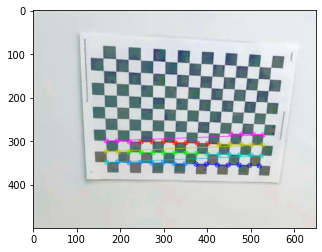

Image written
(150, 1, 2)


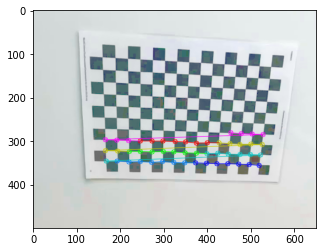

Image written
(150, 1, 2)


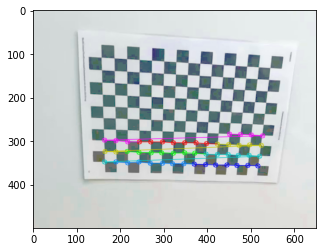

Image written
(150, 1, 2)


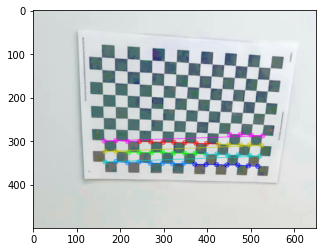

Image written
(150, 1, 2)


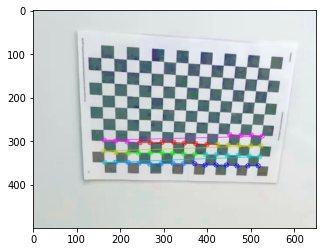

Image written
(150, 1, 2)


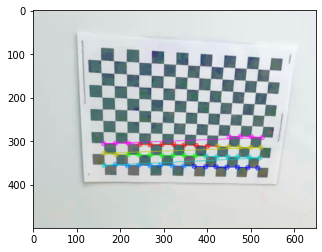

Image written
(150, 1, 2)


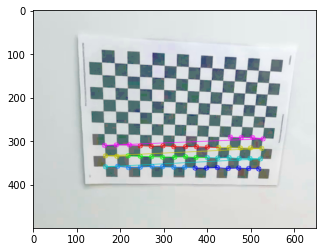

Image written
(150, 1, 2)


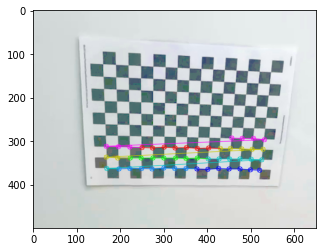

Image written
(150, 1, 2)


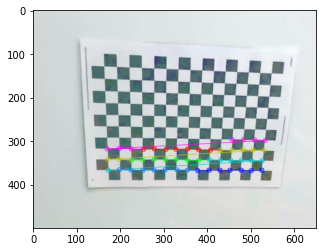

Image written
(150, 1, 2)


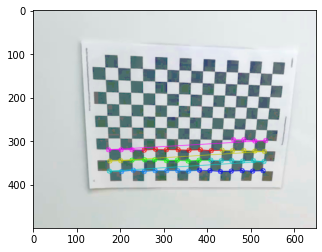

Image written
(150, 1, 2)


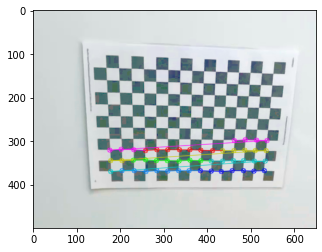

Image written
(150, 1, 2)


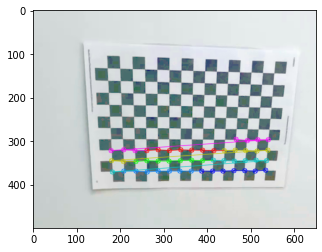

Image written
(150, 1, 2)


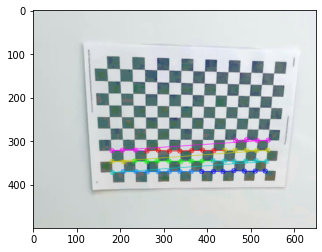

Image written
(150, 1, 2)


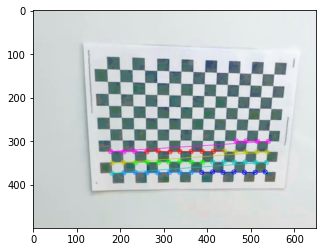

Image written
(150, 1, 2)


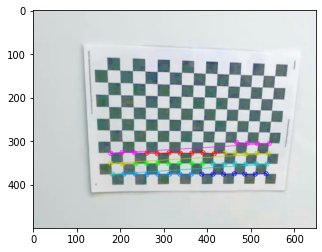

Image written
(150, 1, 2)


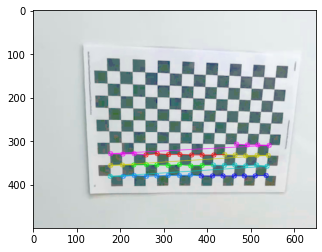

Image written
(150, 1, 2)


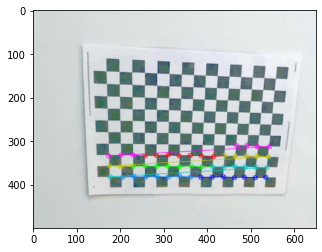

Image written
(150, 1, 2)


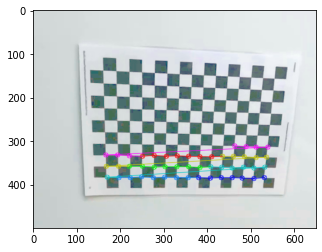

Image written
(150, 1, 2)


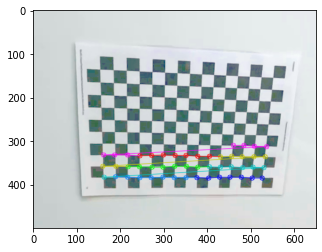

Image written
(150, 1, 2)


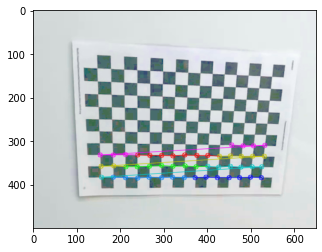

Image written
(150, 1, 2)


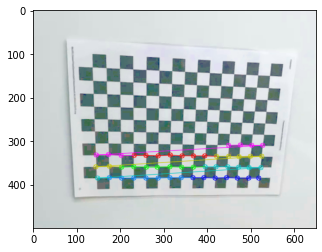

Image written
(150, 1, 2)


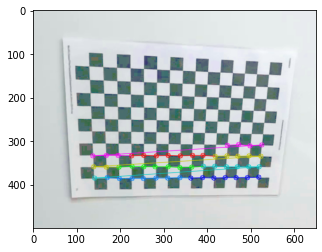

Image written
(150, 1, 2)


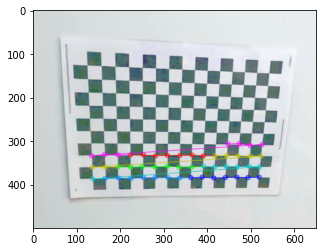

Image written
(150, 1, 2)


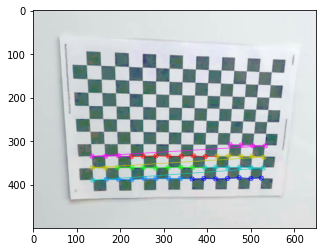

Image written
(150, 1, 2)


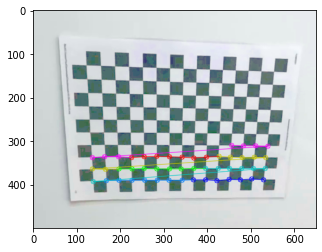

Image written
(150, 1, 2)


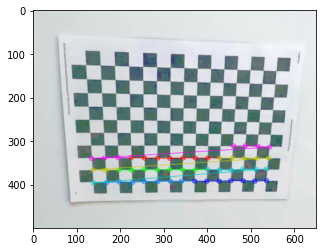

Image written
(150, 1, 2)


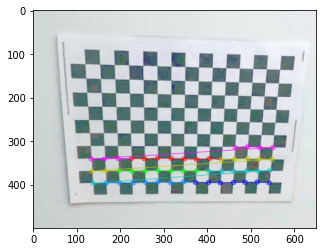

Image written
(150, 1, 2)


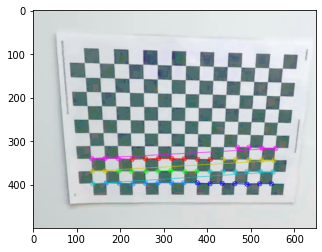

Image written
(150, 1, 2)


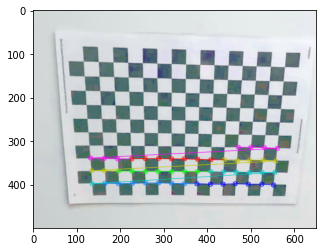

Image written
(150, 1, 2)


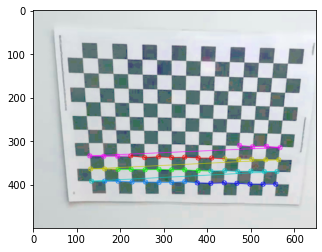

Image written
(150, 1, 2)


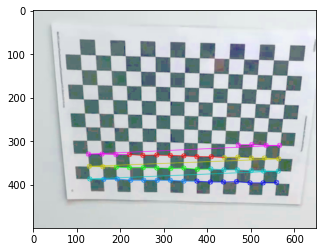

Image written
(150, 1, 2)


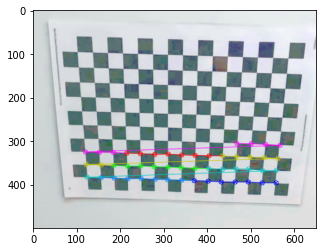

Image written
(150, 1, 2)


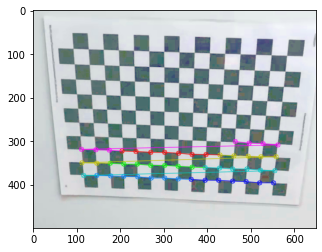

Image written
(150, 1, 2)


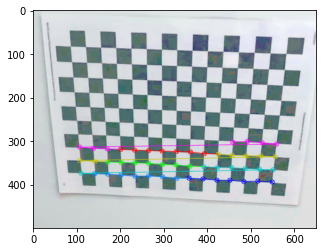

Image written
(150, 1, 2)


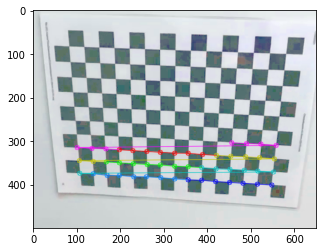

Image written
(150, 1, 2)


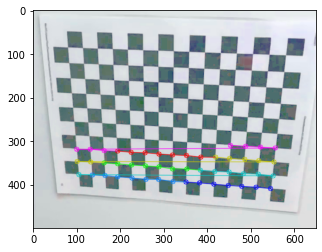

Image written
(150, 1, 2)


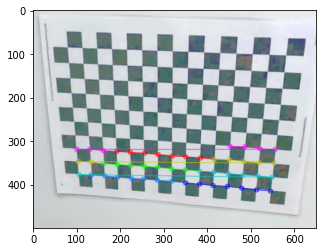

Image written
(150, 1, 2)


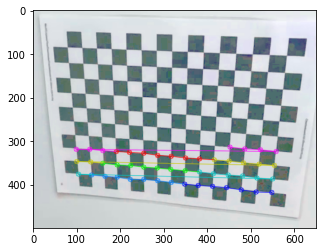

Image written
(150, 1, 2)


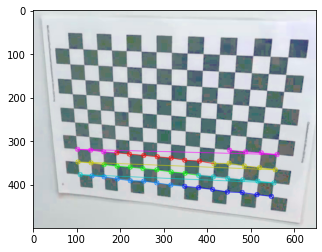

Image written
(150, 1, 2)


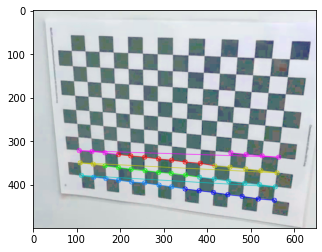

Image written
(150, 1, 2)


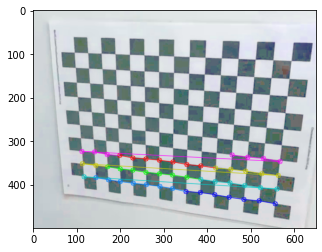

Image written
(150, 1, 2)


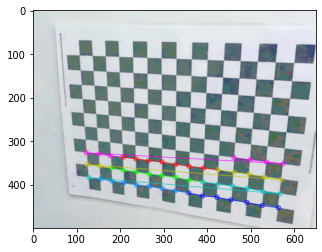

Image written
(150, 1, 2)


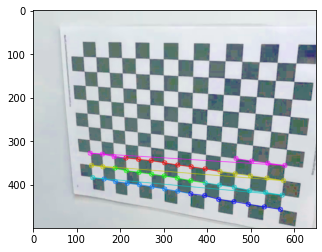

Image written
(150, 1, 2)


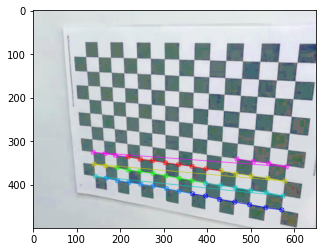

Image written
(150, 1, 2)


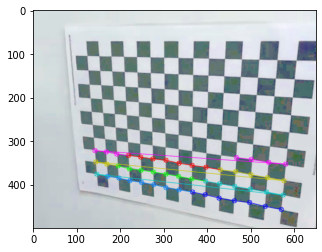

Image written
(150, 1, 2)


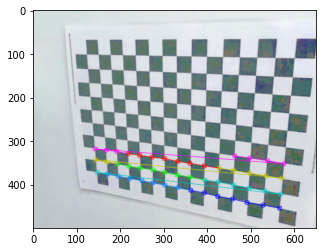

Image written
(150, 1, 2)


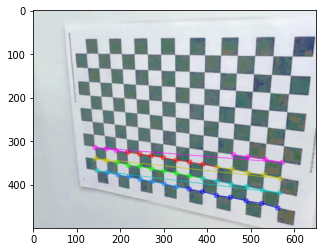

Image written
(150, 1, 2)


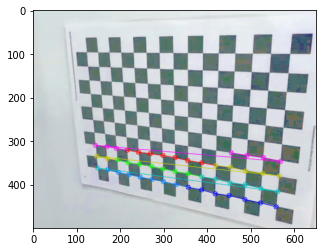

Image written
(150, 1, 2)


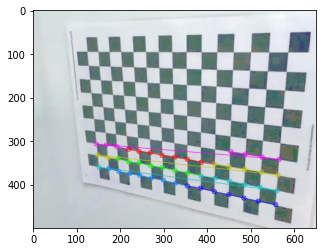

Image written
(150, 1, 2)


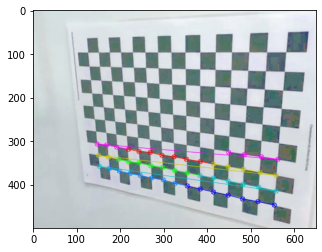

Image written


In [47]:
# 1. Data collection

output_path = "/home/suraj/ClickUp/Mar-Apr/cv-nlp-basics-to-advanced/02_CV/29-camera-calibration/output_path/"

cap = cv2.VideoCapture('InputVideo.mp4')
ret,img = cap.read()

count=0
# number of inside corners in x and y
nx = 15 # num_cols-1
ny = 10 #num_rows-1

while count < 50:
    ret,img = cap.read()
    
    img = increase_brightness(img, value=100)
    img = img[100:600,250:900]
    ret,corners = cv2.findChessboardCorners(img,(nx,ny),
                                            None)
    #print(corners)
    if ret:
        print(corners.shape)
        image = img.copy()
        fnl = cv2.drawChessboardCorners(img, (7, 7), corners, ret)
        plt.imshow(img)
        plt.show()
        #saving image
        name = output_path=str(count)+".jpg"
        cv2.imwrite(name,image)
        print("Image written")
    else:
        print("No Checkerboard Found")
        
    count+=1



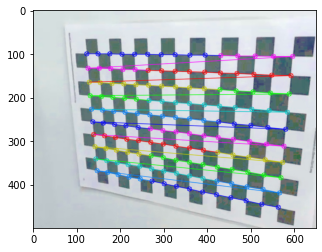

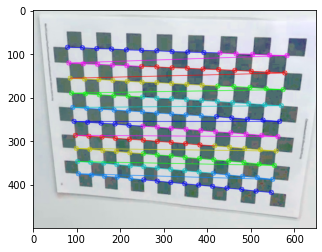

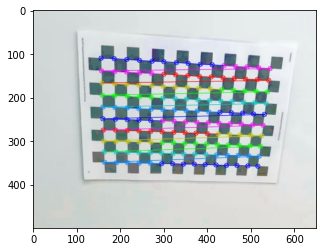

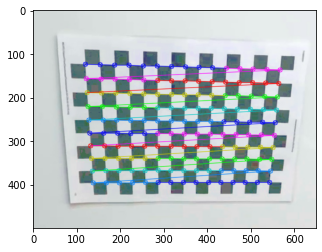

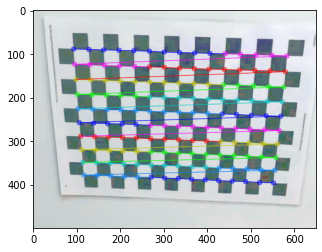

...

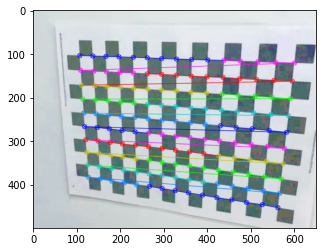

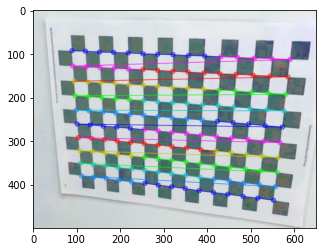

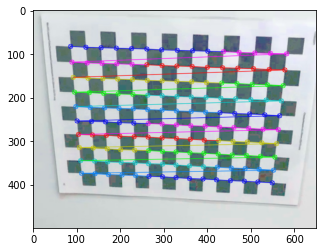

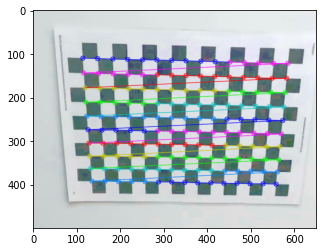

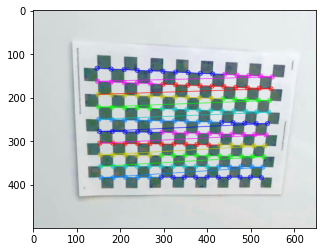

In [50]:
# calibrating camera
camera_param_out_file = "output.yaml"
#termination criteria
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)
#preparing object points in real world
# (0,0,0) , (1,0,0), (2,0,0) ... (15,10,0)
object_points = np.zeros((15*10,3),np.float32)
object_points[:,:2] = np.mgrid[0:10,0:15].T.reshape(-1,2)

#arrays to storeobject points and image points from all images
obj_points, img_points = [],[]
for file in glob.glob('/home/suraj/ClickUp/Mar-Apr/cv-nlp-basics-to-advanced/02_CV/29-camera-calibration/output_path/*.jpg'):
    #reading image as gray scale
    img = cv2.imread(file)
    rgb = img.copy()
    img = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    # finding chess board corners
    ret,corners = cv2.findChessboardCorners(img,(nx,ny),flags=cv2.CALIB_CB_FAST_CHECK)
    if ret == True:
        obj_points.append(object_points)
        corners2 = cv2.cornerSubPix(img,corners,(11,11),(-1,-1),criteria)
        img_points.append(corners)
        #plotting the chess board corners
        cv2.drawChessboardCorners(rgb,(10,15), corners2, ret)
        plt.imshow(rgb)
        plt.show()

In [52]:
#calibrating camera
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(obj_points, img_points, img.shape[::-1], None, None)

In [54]:
mean_error = 0
for i in range(len(obj_points)):
    imgpoints2, _ = cv2.projectPoints(obj_points[i], rvecs[i], tvecs[i], mtx, dist)
    error = cv2.norm(img_points[i], imgpoints2, cv2.NORM_L2)/len(imgpoints2)
    mean_error += error
print( "total error: {}".format(mean_error/len(obj_points)) )
data = {'camera_matrix': np.asarray(mtx).tolist(), 'dist_coeff': np.asarray(dist).tolist()}
print(data)
with open('output.yml', "w") as f:
    yaml.dump(data, f)

total error: 10.190875798702155
{'camera_matrix': [[19351.056819845446, 0.0, -182.95806508786654], [0.0, 2970.591070237026, 117.40257025310378], [0.0, 0.0, 1.0]], 'dist_coeff': [[-189.41226517342577, 9228.970395221835, 3.401078925875402, 1.324722002452749, 125.46783683331735]]}
